In [1]:
## Standard Stuff
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cf
import matplotlib.pyplot as plt
import dask.array as da
import numcodecs

## HEALPix Specific
import healpix as hp
import easygems.healpix as egh
import easygems.remap as egr

import intake     # For catalogs
import zarr       

In [2]:
catfn='/home/tmerlis/hackathon/xsh24_scream_main.yaml'

combo_cat = intake.open_catalog(catfn)

# 'coarse' is an online coarse-graining of 8 neighboring grid cells ~25km
# xsh24 = X-SHiELD 2024 model version, unpublished
# xsh21 = X-SHiELD 2021 model version, many articles including Cheng et al. 2022 GRL
print (list(combo_cat)) 

['xsh24_coarse', 'xsh24_native', 'xsh21_coarse', 'scream2D_hrly', 'scream_ne120', 'scream_lnd']


In [3]:
# select zoom level and the part of the combined catalog you're interested in
# coarse stores are available at zoom 7 ~50km and lower
zoom_select = 7
ds = combo_cat.xsh24_coarse(zoom=zoom_select).to_dask()
# attach coordinates; otherwise can't use lat and lon and selecting regions or taking a zonal mean won't work
ds = ds.pipe(egh.attach_coords)
ds = ds.assign_coords(lon=(((ds.lon + 180) % 360) - 180))

/home/qs6476/.conda/envs/easy25/lib/python3.12/site-packages/intake_xarray/base.py:21: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  'dims': dict(self._ds.dims),


In [4]:
def worldmap(var, **kwargs):
    #projection = ccrs.Robinson(central_longitude=-135.5808361)
    projection = ccrs.Robinson(central_longitude=0)
    fig, ax = plt.subplots(
        figsize=(8, 4), subplot_kw={"projection": projection}, constrained_layout=True
    )
    ax.set_global()
    ax.coastlines()

    hpshow = egh.healpix_show(var, ax=ax, **kwargs)
    cbar = plt.colorbar(hpshow, ax=ax, orientation='vertical', 
                    pad=0.05, shrink=0.8)

    
def regionalmap(var, extent, **kwargs):
    #projection = ccrs.Robinson(central_longitude=-135.5808361)
    projection = ccrs.Robinson(central_longitude=0)
    fig, ax = plt.subplots(
        figsize=(8, 4), subplot_kw={"projection": projection}, constrained_layout=True
    )
    ax.set_extent(extent)
    ax.coastlines()
    gl = ax.gridlines()
    gl.top_labels = True
    gl.left_labels = True
    hpshow = egh.healpix_show(var, ax=ax, **kwargs)
    cbar = plt.colorbar(hpshow, ax=ax, orientation='vertical', 
                    pad=0.05, shrink=0.8)

### global precipitation diurnal cycle

Text(0.5, 1.0, 'Precipitation Dirunal Cycle Peak Local Time (JJA)')

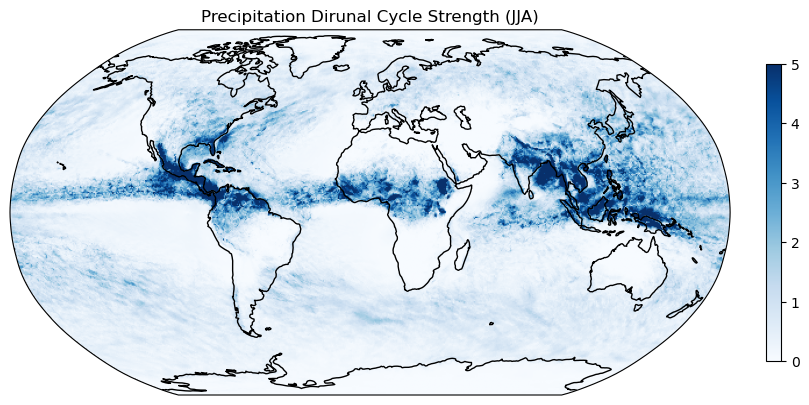

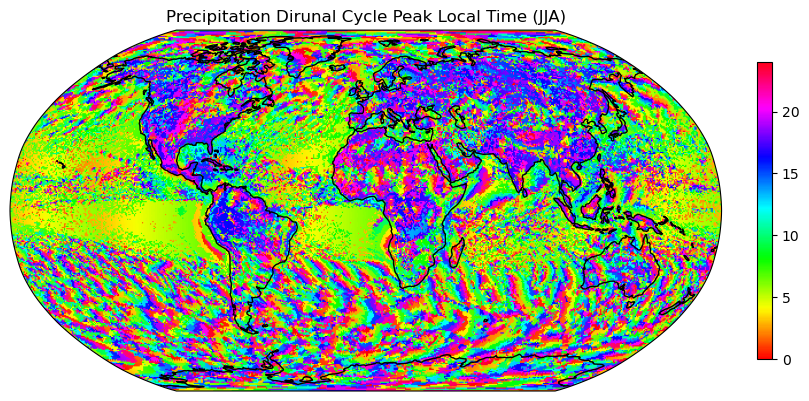

In [5]:
# JJA
ds_global_hrly = ds.sel(time=slice('2020-06-01', '2020-08-31')).groupby('time.hour').mean()

worldmap(ds_global_hrly.pr.std(dim="hour")*86400., cmap='Blues', vmin=0, vmax=5)
plt.title('Precipitation Dirunal Cycle Strength (JJA)')

ds_global_hrly = ds_global_hrly.assign(max_pr_utc=ds_global_hrly.pr.argmax(dim="hour")*3)
ds_global_hrly = ds_global_hrly.assign(max_pr_localhour=(ds_global_hrly.max_pr_utc + ds_global_hrly.lon/360*24 + 24) % 24)
worldmap(ds_global_hrly.max_pr_localhour, vmin=0, vmax=24, cmap='hsv')
plt.title('Precipitation Dirunal Cycle Peak Local Time (JJA)')

Text(0.5, 1.0, 'Precipitation Dirunal Cycle Peak Local Time (DJF)')

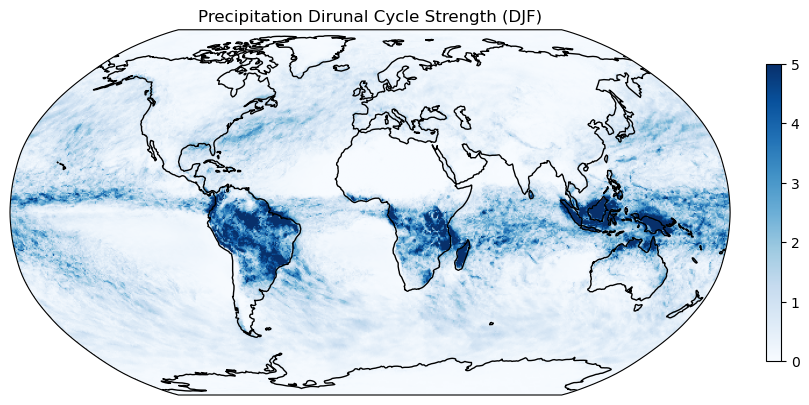

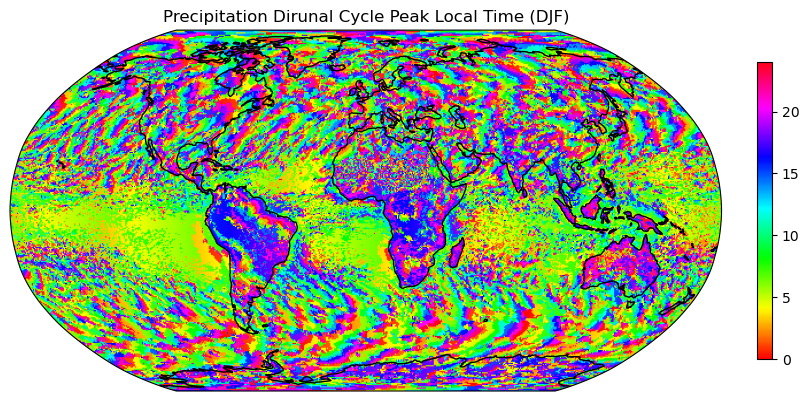

In [6]:
# DJF
ds_global_hrly = ds.sel(time=slice('2019-12-01', '2020-02-29')).groupby('time.hour').mean()

worldmap(ds_global_hrly.pr.std(dim="hour")*86400., cmap='Blues', vmin=0, vmax=5)
plt.title('Precipitation Dirunal Cycle Strength (DJF)')

ds_global_hrly = ds_global_hrly.assign(max_pr_utc=ds_global_hrly.pr.argmax(dim="hour")*3)
ds_global_hrly = ds_global_hrly.assign(max_pr_localhour=(ds_global_hrly.max_pr_utc + ds_global_hrly.lon/360*24 + 24) % 24)
worldmap(ds_global_hrly.max_pr_localhour, vmin=0, vmax=24, cmap='hsv')
plt.title('Precipitation Dirunal Cycle Peak Local Time (DJF)')

zoom into south atlantic high lat

In [7]:
def regionaldata(data, extent):
    cell_mask = np.where((data.lat<extent[3]) & (data.lat>extent[2]) & (data.lon>extent[0]) & (data.lon<extent[1]))[0]
    data_regional = data.isel(cell=cell_mask)
    return data_regional

Text(0.5, 1.0, 'Precipitation Dirunal Cycle Peak Local Time (JJA)')

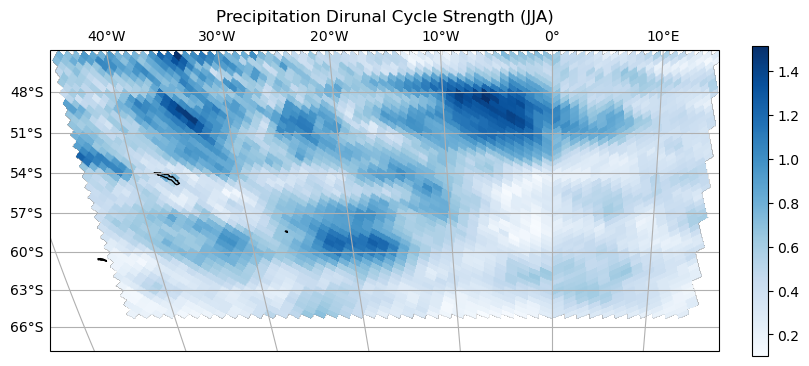

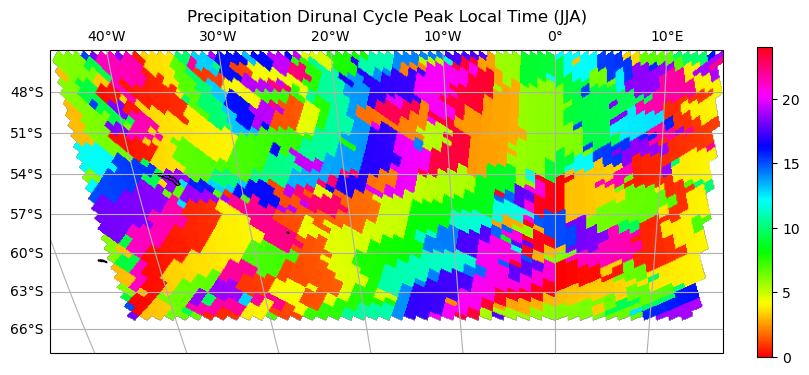

In [8]:
SA = [-45, 15, -65, -45]
ds_SA = regionaldata(ds, SA)
ds_SA_hrly = ds_SA.sel(time=slice('2019-12-01', '2020-02-29')).groupby('time.hour').mean()

regionalmap(ds_SA_hrly.pr.std(dim="hour")*86400., SA, cmap='Blues')
plt.title('Precipitation Dirunal Cycle Strength (JJA)')

ds_SA_hrly = ds_SA_hrly.assign(max_pr_utc=ds_SA_hrly.pr.argmax(dim="hour")*3)
ds_SA_hrly = ds_SA_hrly.assign(max_pr_localhour=(ds_SA_hrly.max_pr_utc + ds_SA_hrly.lon/360*24 + 24) % 24)
regionalmap(ds_SA_hrly.max_pr_localhour, SA, vmin=0, vmax=24, cmap='hsv')
plt.title('Precipitation Dirunal Cycle Peak Local Time (JJA)')

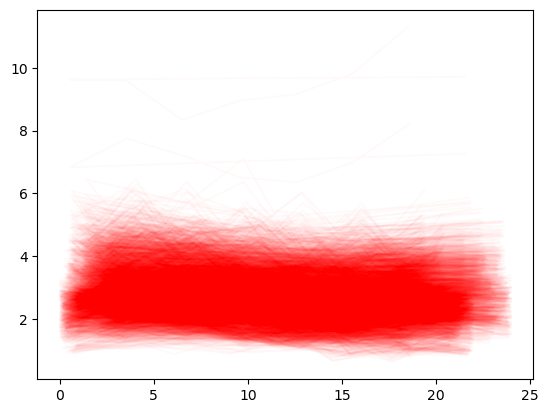

In [20]:
#for i in range(100):
#    cell = ds_SA_hrly.cell
#    cell_sel = np.random.choice(cell)
plt.plot((ds_SA_hrly.hour + ds_SA_hrly.lon/360*24 +24)%24, ds_SA_hrly.pr*86400., 'r', alpha=0.02)
plt.show()

In [324]:
ds_hrly = ds.sel(time=slice('2020-06-01', '2020-08-31')).groupby('time.hour').mean()
ds_hrly

<xarray.Dataset> Size: 2GB
Dimensions:  (hour: 8, cell: 196608, plev: 31, pfull: 79)
Coordinates:
  * pfull    (pfull) float32 316B 4.514 8.301 12.45 16.74 ... 989.5 994.3 998.3
  * plev     (plev) float32 124B 1.0 2.0 3.0 5.0 7.0 ... 925.0 950.0 975.0 1e+03
    crs      int64 8B 0
  * cell     (cell) int64 2MB 0 1 2 3 4 5 ... 196603 196604 196605 196606 196607
    lat      (cell) float64 2MB 0.2984 0.5968 0.5968 ... -0.5968 -0.5968 -0.2984
    lon      (cell) float64 2MB 45.0 45.35 44.65 45.0 ... -44.65 -45.35 -45.0
  * hour     (hour) int64 64B 0 3 6 9 12 15 18 21
Data variables: (12/38)
    clivi    (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    clt      (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    clwvi    (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hflsd    (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hfssd    (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hur      (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    ...       ...
    uas      (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    va       (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    vas      (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    wa       (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    wap      (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    zg       (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>

In [257]:
dsn_hrly = dsn_tropAtlantic.groupby('time.hour').mean()
dsn_hrly

<xarray.Dataset> Size: 395MB
Dimensions:       (hour: 8, cell: 542587)
Coordinates:
    crs           int64 8B 0
  * cell          (cell) int64 4MB 3145728 3145729 3145730 ... 12582910 12582911
    lat           (cell) float64 4MB 0.0373 0.0746 0.0746 ... -0.0746 -0.0373
    lon           (cell) float64 4MB -45.0 -44.96 -45.04 ... -44.96 -45.04 -45.0
  * hour          (hour) int64 64B 0 3 6 9 12 15 18 21
Data variables: (12/22)
    40dBz_height  (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    CAPE_max      (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    CIN_max       (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    TMP500_300    (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    clivi         (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    clwvi         (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    ...            ...
    w500          (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    w850          (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    wind100m      (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    wind10mmax    (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    wmaxdn_min    (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>
    wmaxup_max    (hour, cell) float32 17MB dask.array<chunksize=(8, 262144), meta=np.ndarray>

Text(0.5, 1.0, 'Precipitation Dirunal Cycle Strength (JJA)')

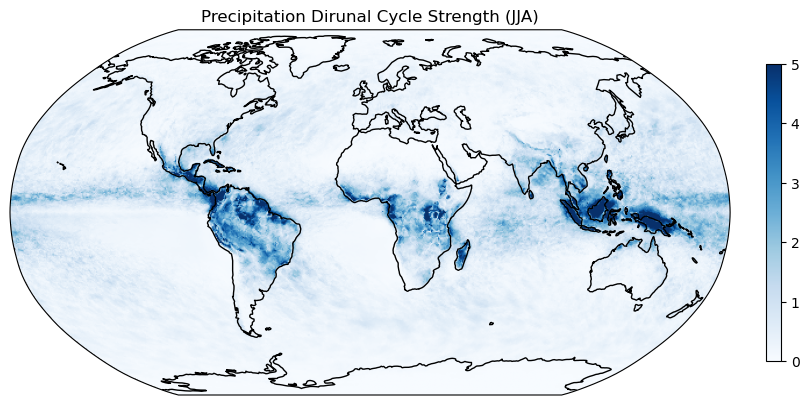

In [279]:
worldmap(ds_hrly.pr.std(dim="hour")*86400., cmap='Blues', vmin=0, vmax=5)
plt.title('Precipitation Dirunal Cycle Strength (JJA)')

Text(0.5, 1.0, 'Precipitation Dirunal Cycle Strength (JJA) (native)')

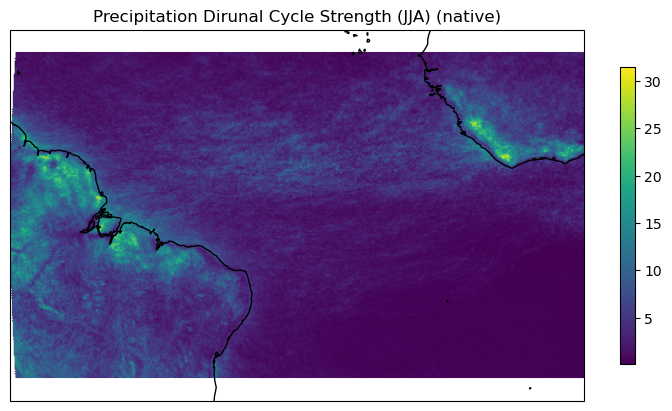

In [259]:
tropAtlanticmap(dsn_hrly.pr.max(dim="hour")*86400.-dsn_hrly.pr.min(dim="hour")*86400.)
plt.title('Precipitation Dirunal Cycle Strength (JJA) (native)')

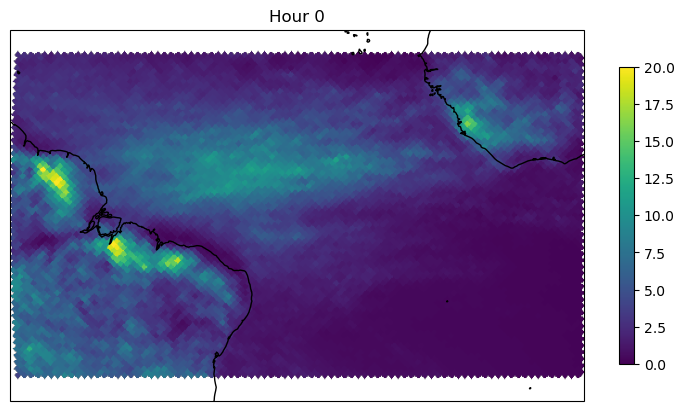

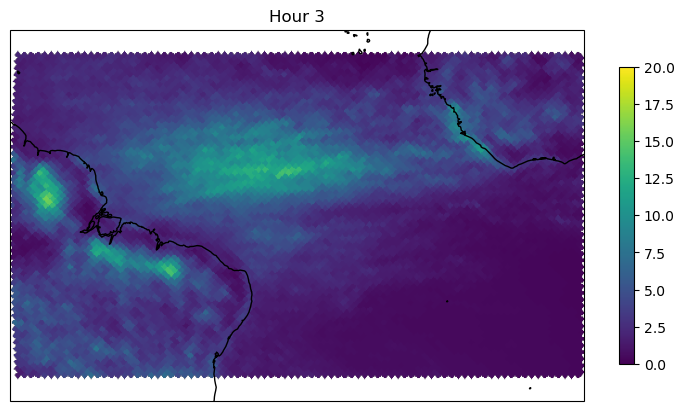

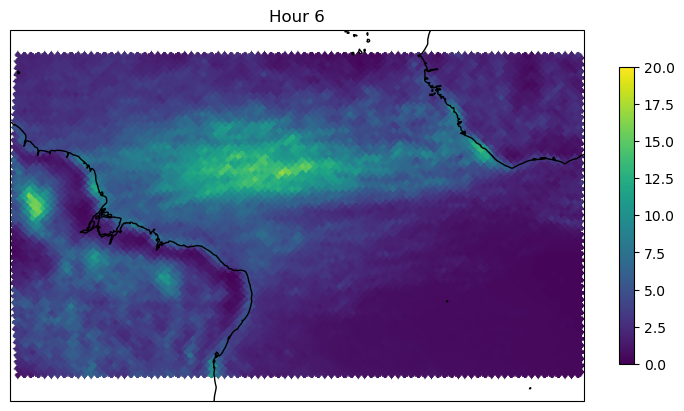

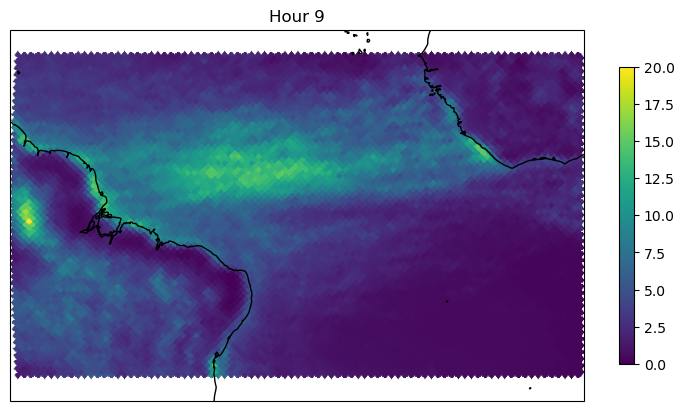

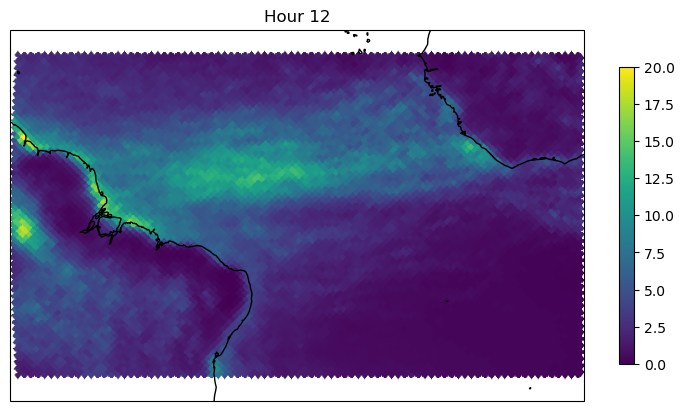

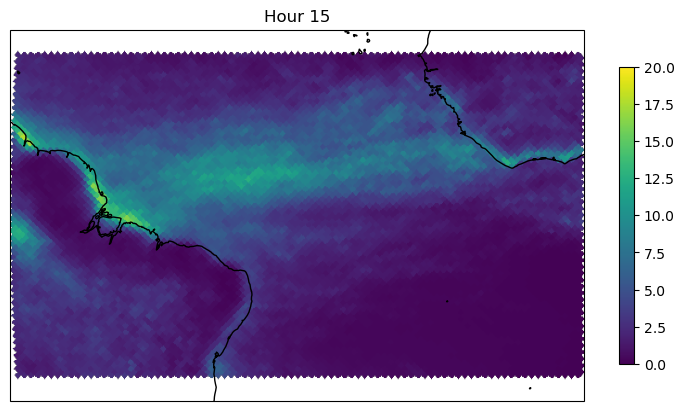

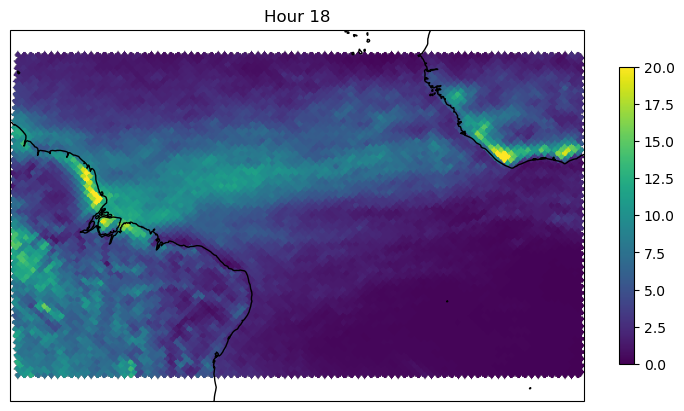

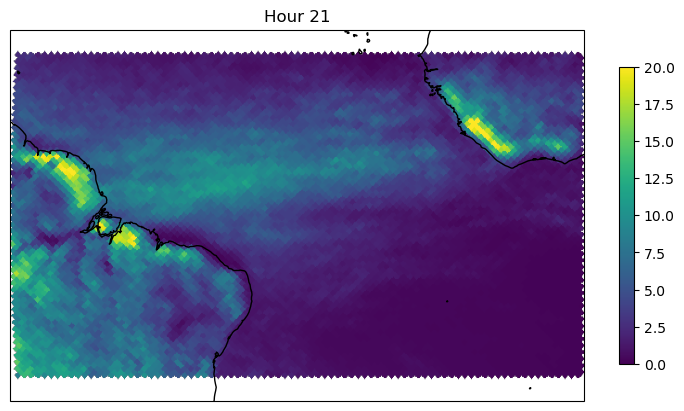

In [224]:
for i in range(8):
    tropAtlanticmap(ds_hrly.pr.sel(hour=i*3)*86400., vmin=0, vmax=20)
    plt.title(f'Hour {i*3}')

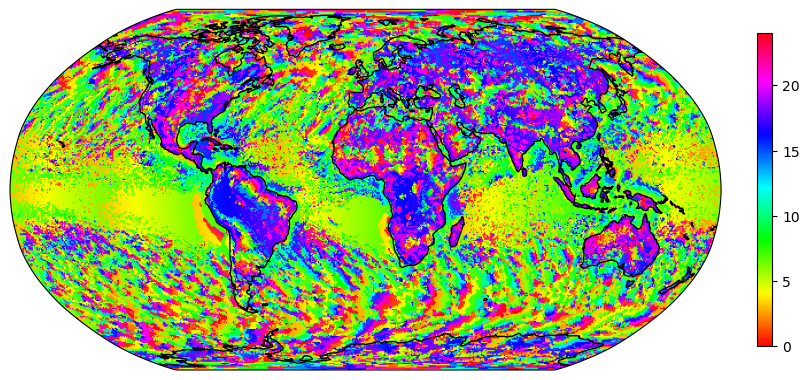

In [277]:
ds_hrly = ds_hrly.assign(max_pr_utc=ds_hrly.pr.argmax(dim="hour")*3)
ds_hrly = ds_hrly.assign(max_pr_localhour=(ds_hrly.max_pr_utc + ds_hrly.lon/360*24 + 24) % 24)
worldmap(ds_hrly.max_pr_localhour, vmin=0, vmax=24, cmap='hsv')

In [281]:
ds_hrly = ds_hrly.assign(max_pr=ds_hrly.pr.max(dim="hour"))
ds_hrly

<xarray.Dataset> Size: 2GB
Dimensions:           (hour: 8, cell: 196608, plev: 31, pfull: 79)
Coordinates:
  * pfull             (pfull) float32 316B 4.514 8.301 12.45 ... 994.3 998.3
  * plev              (plev) float32 124B 1.0 2.0 3.0 5.0 ... 950.0 975.0 1e+03
    crs               int64 8B 0
  * cell              (cell) int64 2MB 0 1 2 3 4 ... 196604 196605 196606 196607
    lat               (cell) float64 2MB 0.2984 0.5968 ... -0.5968 -0.2984
    lon               (cell) float64 2MB 45.0 45.35 44.65 ... -45.35 -45.0
  * hour              (hour) int64 64B 0 3 6 9 12 15 18 21
Data variables: (12/41)
    clivi             (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    clt               (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    clwvi             (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hflsd             (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hfssd             (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hur               (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    ...                ...
    wa                (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    wap               (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    zg                (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    max_pr_utc        (cell) int64 2MB dask.array<chunksize=(196608,), meta=np.ndarray>
    max_pr_localhour  (cell) float64 2MB dask.array<chunksize=(196608,), meta=np.ndarray>
    max_pr            (cell) float32 786kB dask.array<chunksize=(196608,), meta=np.ndarray>

In [318]:
ocean_mask = np.where(ds_hrly.sftlf==0)[0]
ds_hrly = ds_hrly.assign(max_pr_ocean=ds_hrly.max_pr*
                         xr.where(ds_hrly.sftlf.isel(hour=0) == 0, 1, np.nan)
                        )
ds_hrly = ds_hrly.assign(max_pr_land=ds_hrly.max_pr*
                         xr.where(ds_hrly.sftlf.isel(hour=0) == 0, np.nan, 1)
                        )

In [315]:
xr.where(ds_hrly.sftlf.isel(hour=0) == 0, 1, np.nan).values

array([1., 1., 1., ..., 1., 1., 1.], shape=(196608,))

In [306]:
ds_hrly

<xarray.Dataset> Size: 2GB
Dimensions:           (hour: 8, cell: 196608, plev: 31, pfull: 79, time: 3560)
Coordinates:
  * pfull             (pfull) float32 316B 4.514 8.301 12.45 ... 994.3 998.3
  * plev              (plev) float32 124B 1.0 2.0 3.0 5.0 ... 950.0 975.0 1e+03
    crs               int64 8B 0
  * cell              (cell) int64 2MB 0 1 2 3 4 ... 196604 196605 196606 196607
    lat               (cell) float64 2MB 0.2984 0.5968 ... -0.5968 -0.2984
    lon               (cell) float64 2MB 45.0 45.35 44.65 ... -45.35 -45.0
  * hour              (hour) int64 64B 0 3 6 9 12 15 18 21
  * time              (time) object 28kB 2019-10-20 03:00:00 ... 2021-01-07 0...
Data variables: (12/42)
    clivi             (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    clt               (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    clwvi             (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hflsd             (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hfssd             (hour, cell) float32 6MB dask.array<chunksize=(8, 196608), meta=np.ndarray>
    hur               (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    ...                ...
    wap               (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    zg                (hour, plev, cell) float32 195MB dask.array<chunksize=(8, 8, 196608), meta=np.ndarray>
    max_pr_utc        (cell) int64 2MB dask.array<chunksize=(196608,), meta=np.ndarray>
    max_pr_localhour  (cell) float64 2MB dask.array<chunksize=(196608,), meta=np.ndarray>
    max_pr            (cell) float32 786kB dask.array<chunksize=(196608,), meta=np.ndarray>
    max_pr_ocean      (cell, hour) float32 6MB dask.array<chunksize=(196608, 8), meta=np.ndarray>

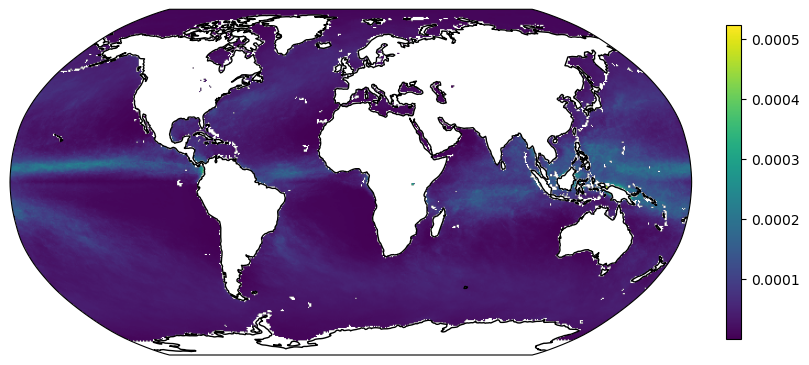

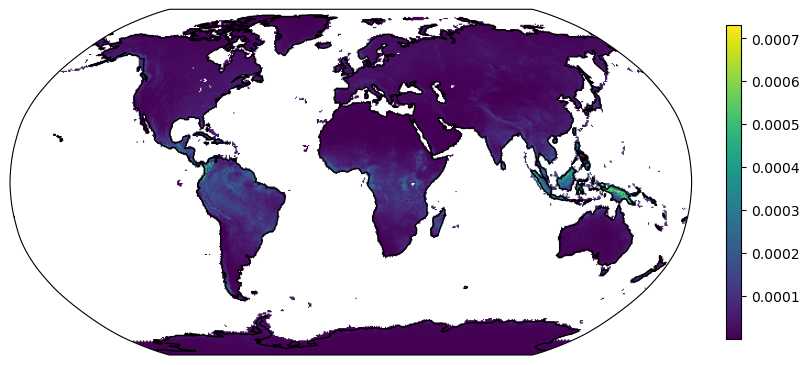

In [319]:
worldmap(ds_hrly.max_pr_ocean)
worldmap(ds_hrly.max_pr_land)


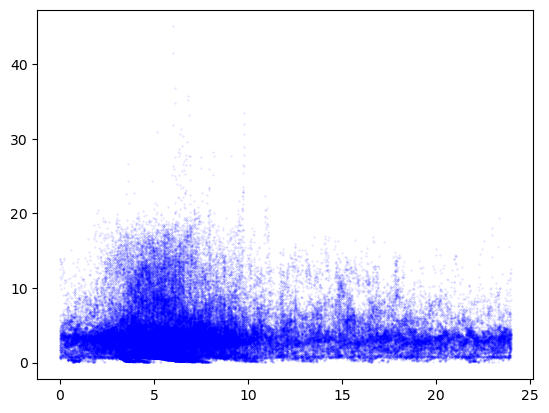

In [320]:
plt.scatter(ds_hrly.max_pr_localhour, ds_hrly.max_pr_ocean*86400., s=0.1, color='b', alpha=0.2)

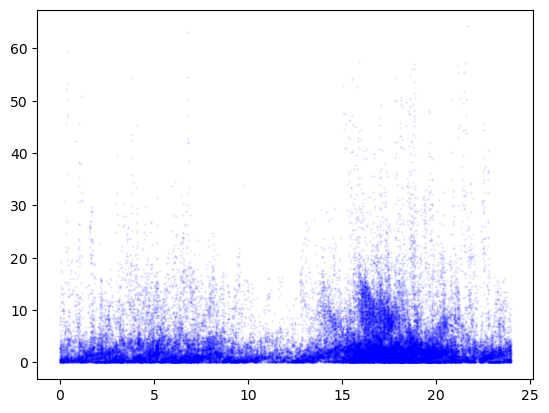

In [321]:
plt.scatter(ds_hrly.max_pr_localhour, ds_hrly.max_pr_land*86400., s=0.1, color='b', alpha=0.2)

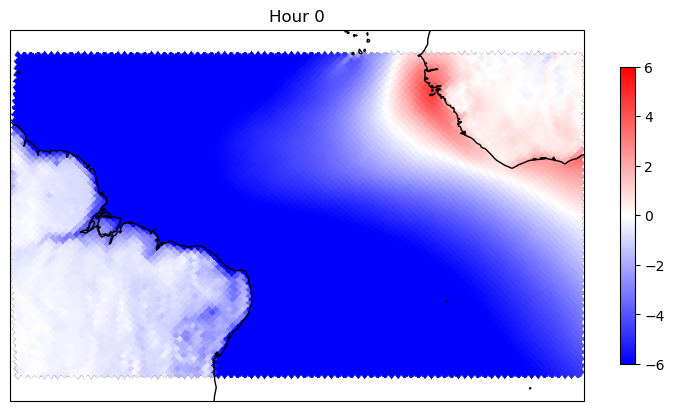

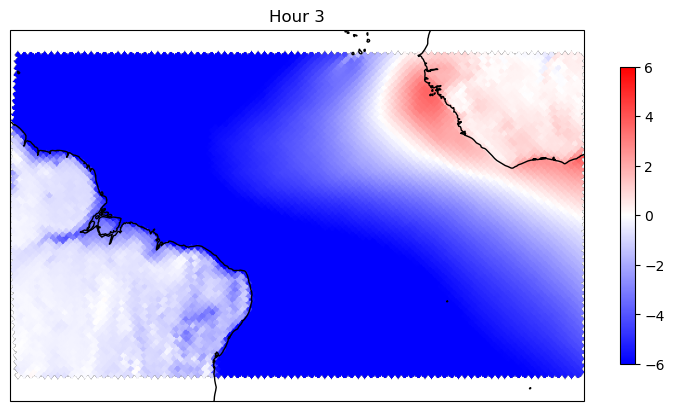

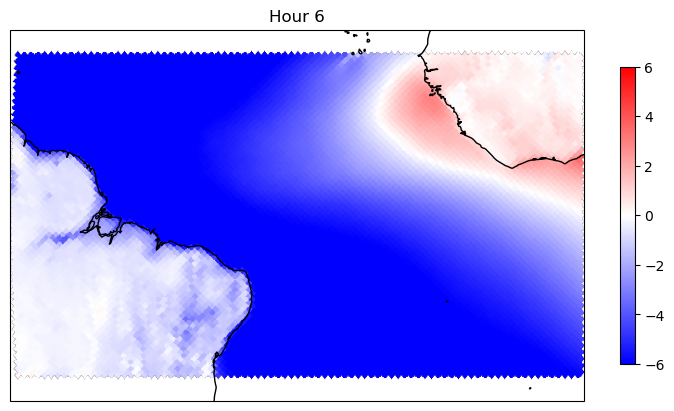

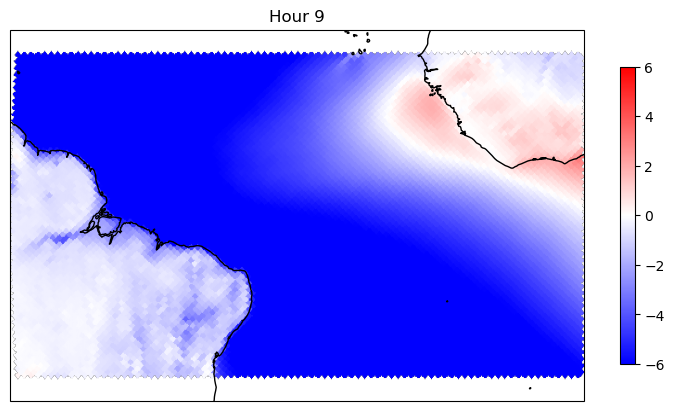

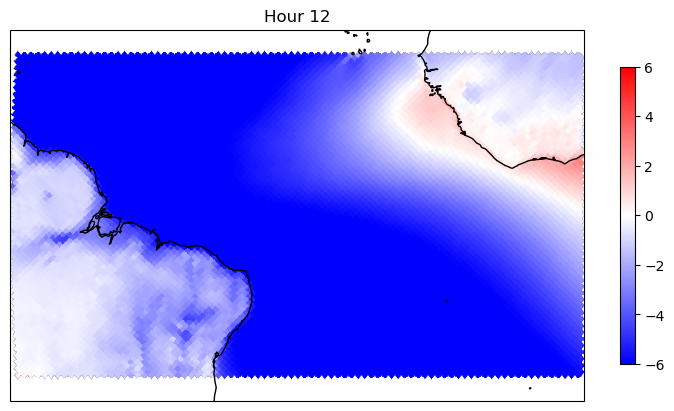

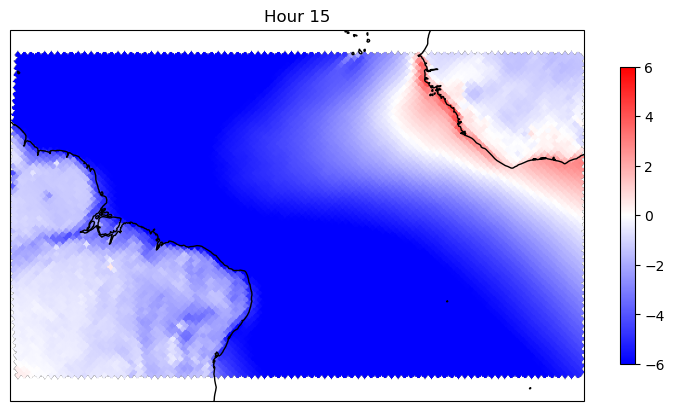

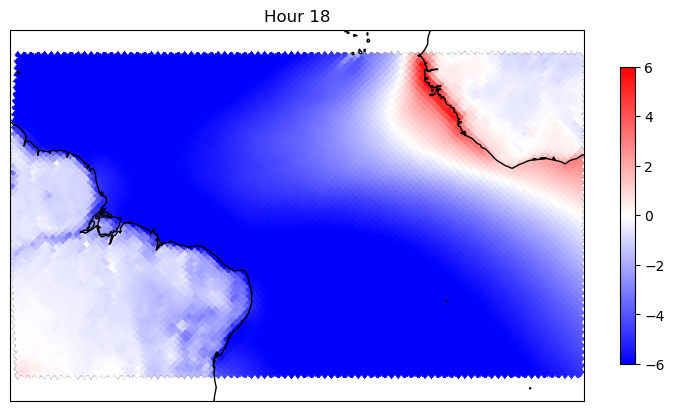

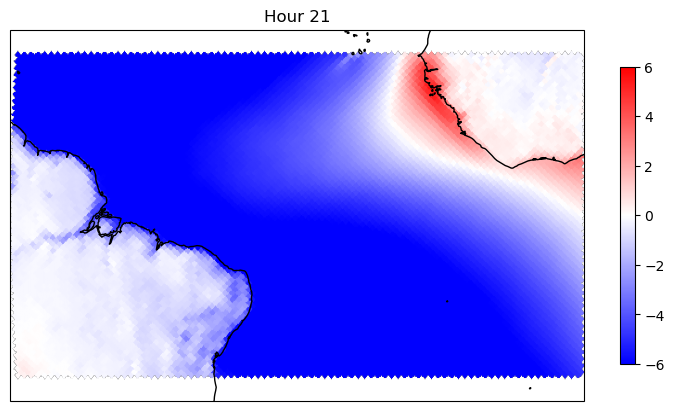

In [233]:
for i in range(8):
    tropAtlanticmap(ds_hrly.ua.sel(plev=1000,hour=i*3), vmin=-6, vmax=6, cmap='bwr')
    plt.title(f'Hour {i*3}')

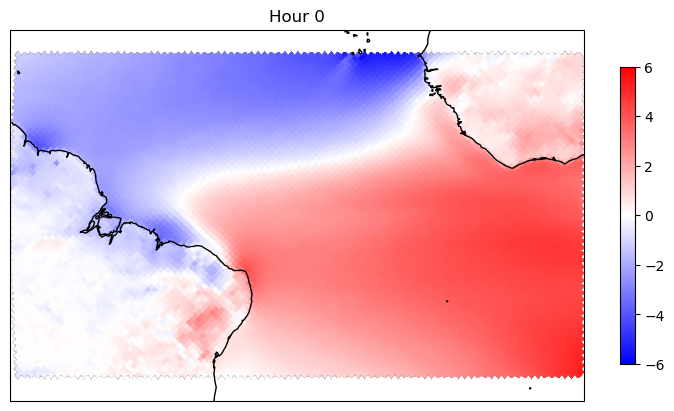

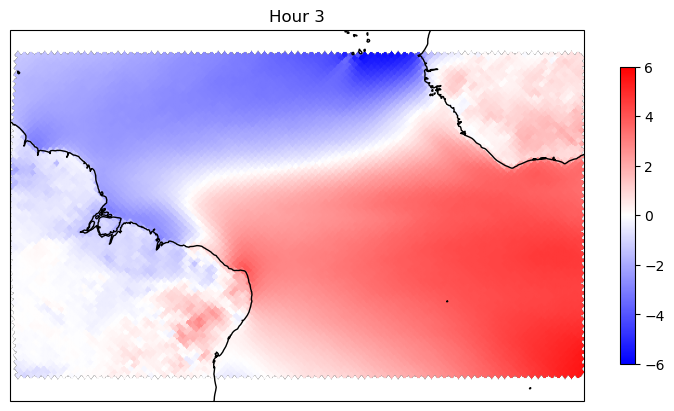

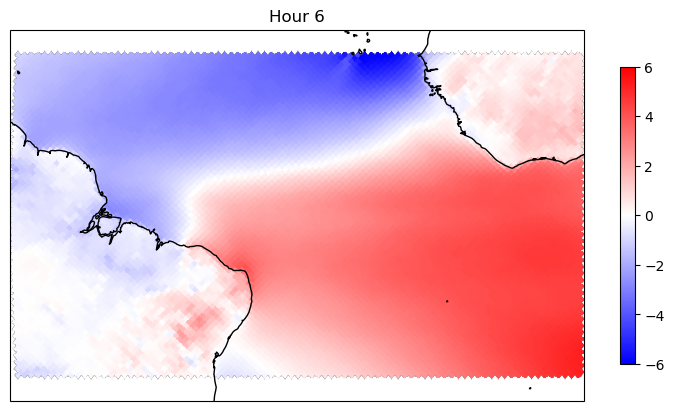

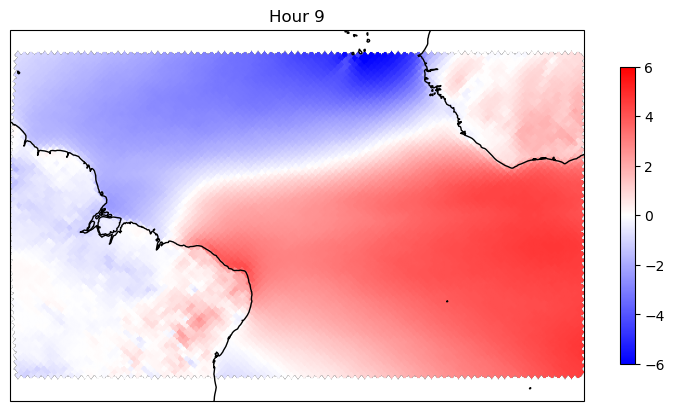

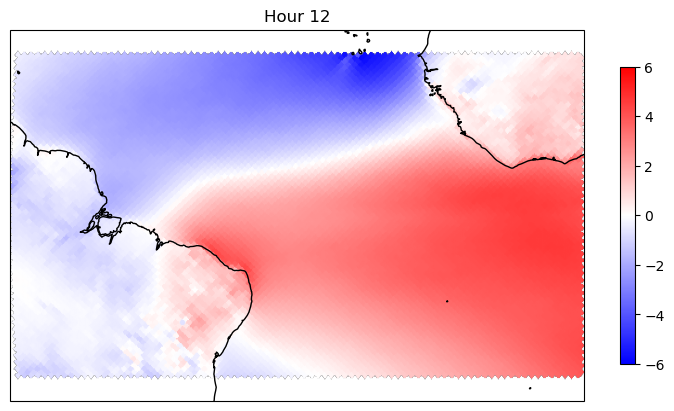

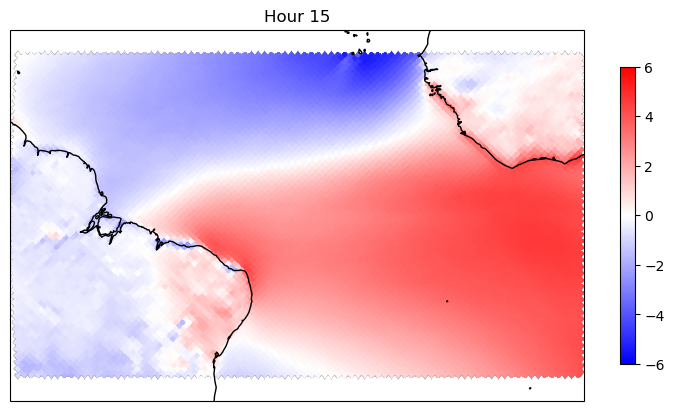

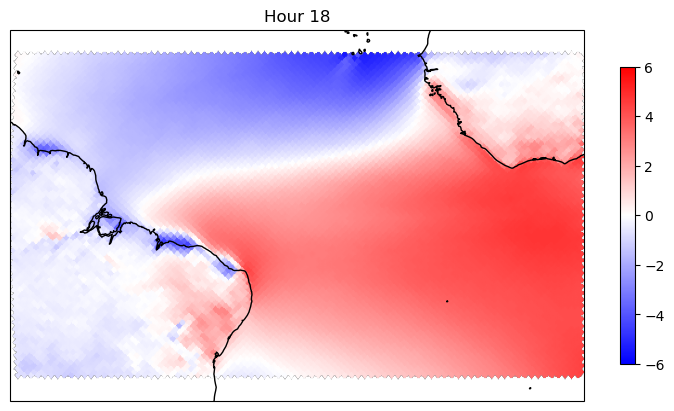

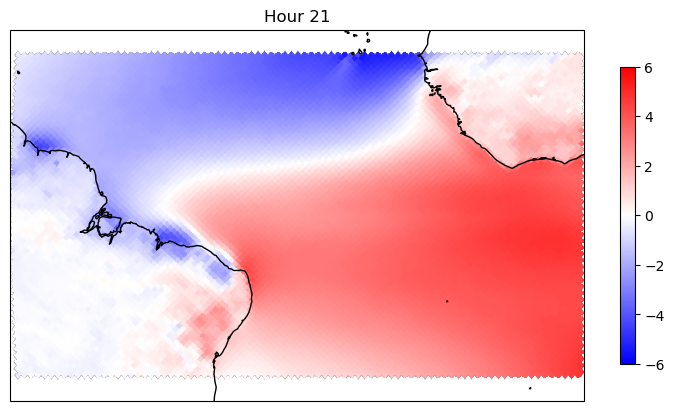

In [229]:
for i in range(8):
    tropAtlanticmap(ds_hrly.vas.sel(hour=i*3), vmin=-6, vmax=6, cmap='bwr')
    plt.title(f'Hour {i*3}')

77165 10.199918091116302 -15.1171875


 ...]

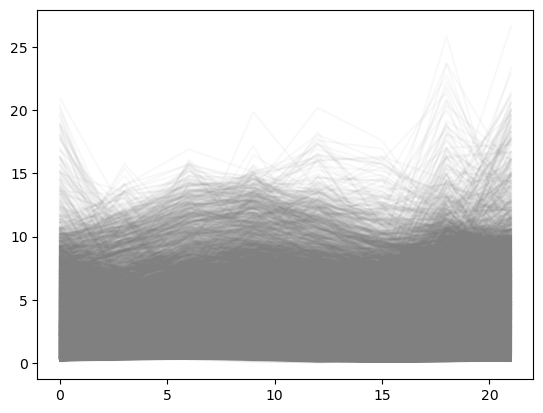

In [219]:
cell = ds_hrly.cell
cell_sel = np.random.choice(cell)
print(cell_sel, ds_hrly.sel(cell=cell_sel).lat.values, ds_hrly.sel(cell=cell_sel).lon.values)
#print(ds_hrly.hour + ds_hrly.sel(cell=cell_sel).lon/360*24, ds_hrly.pr.sel(cell=cell_sel)*86400)
#plt.plot(ds_hrly.hour + ds_hrly.sel(cell=cell_sel).lon/360*24, ds_hrly.pr.sel(cell=cell_sel)*86400)
plt.plot(ds_hrly.hour, ds_hrly.pr*86400., color='gray', alpha=0.05)

 ...]

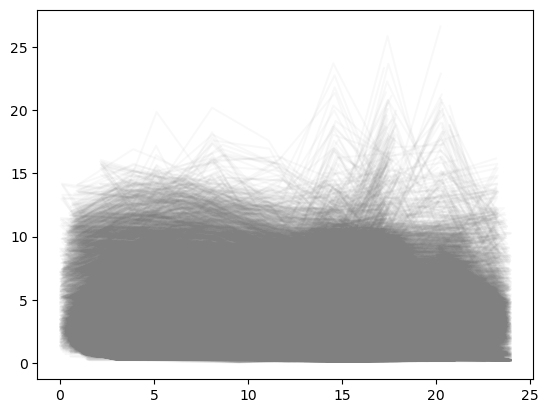

In [220]:
ds_hrly = ds_hrly.assign(local_hour=(ds_hrly.hour + ds_hrly.lon/360*24 + 24) % 24)
plt.plot(ds_hrly.local_hour, ds_hrly.pr*86400., color='gray', alpha=0.05)

2020-01-31
2020-02-29
2020-03-31
2020-04-30
2020-05-31
2020-06-30
2020-07-31
2020-08-31
2020-09-30
2020-10-31
2020-11-30
2020-12-31
CPU times: user 4.42 s, sys: 1.41 s, total: 5.83 s
Wall time: 2.67 s


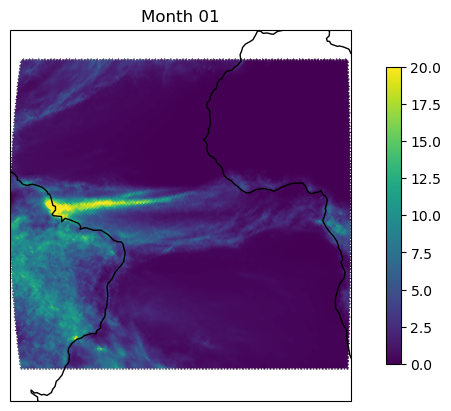

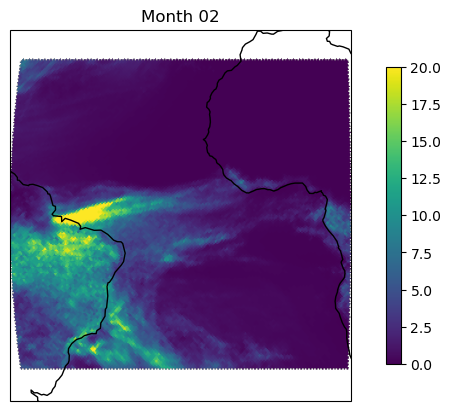

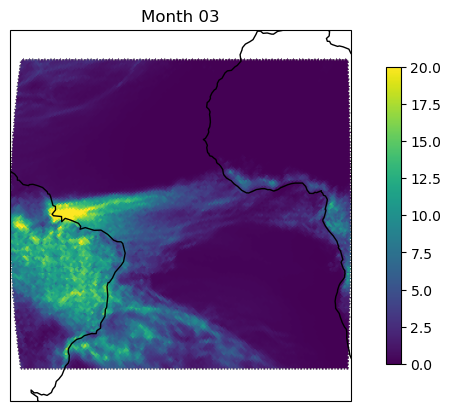

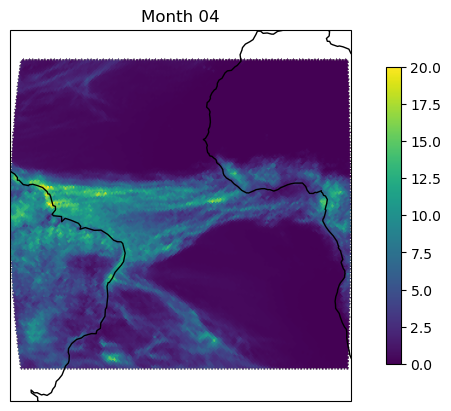

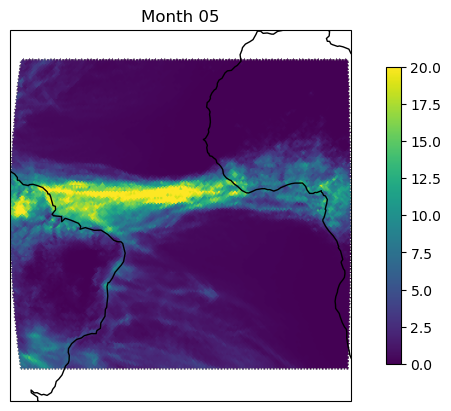

...

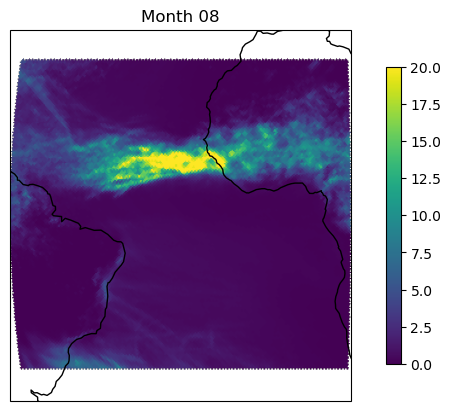

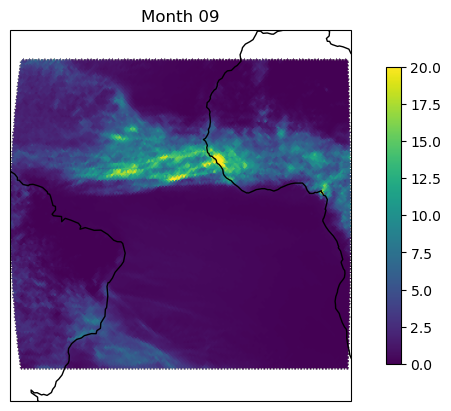

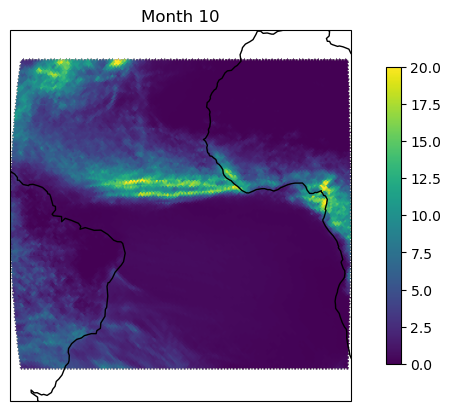

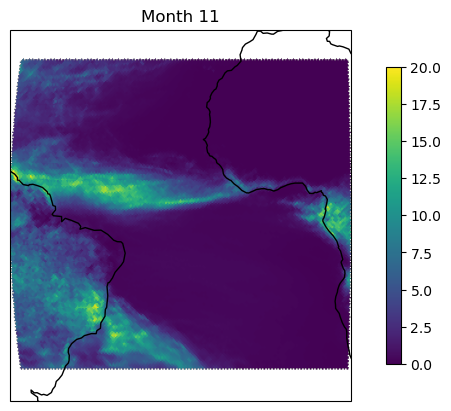

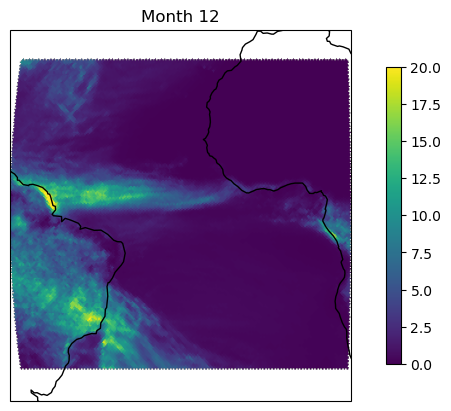

In [88]:
%%time

for i in range(12):
    str_month = str(i+1).zfill(2)
    end_day = 31
    if (i+1)==2:
        end_day = 29
    elif i+1 in [4,6,9,11]:
        end_day = 30
    print(f'2020-{str_month}-{end_day}')
    tropAtlanticmap(ds_tropAtlantic.pr.sel(time=slice(f'2020-{str_month}-01', f'2020-{str_month}-{end_day}')).mean(dim='time')*86400., vmin=0, vmax=20)
    plt.title(f'Month {str_month}')

In [105]:
test = ds_tropAtlantic.sel(time=slice('2020-06-01', '2020-08-31')).groupby("time.hour").mean()
test.cell

<xarray.DataArray 'cell' (cell: 20448)> Size: 164kB
array([  8744,   8746,   8747, ..., 196605, 196606, 196607], shape=(20448,))
Coordinates:
    crs      int64 8B 0
  * cell     (cell) int64 164kB 8744 8746 8747 8832 ... 196605 196606 196607
    lat      (cell) float64 164kB 26.94 27.28 27.62 ... -0.5968 -0.5968 -0.2984
    lon      (cell) float64 164kB 14.77 14.41 14.77 ... -44.65 -45.35 -45.0

In [ ]:
cp = 1004.
Lv = 2.5e6
g = 9.8
MSE = cp*ds_tropAtlantic['ta'] + Lv*ds_tropAtlantic['']

<xarray.DataArray 'lon' (cell: 98176)> Size: 785kB
array([225.       , 225.3515625, 224.6484375, ..., 315.3515625,
       314.6484375, 315.       ], shape=(98176,))
Coordinates:
    crs      int64 8B 0
  * cell     (cell) int64 785kB 32768 32769 32770 32771 ... 196605 196606 196607
    lat      (cell) float64 785kB 0.2984 0.5968 0.5968 ... -0.5968 -0.2984
    lon      (cell) float64 785kB 225.0 225.4 224.6 225.0 ... 315.4 314.6 315.0
Attributes:
    units:          degree_east
    standard_name:  longitude
    axis:           X
<xarray.DataArray 'lon' (cell: 0)> Size: 0B
array([], dtype=float64)
Coordinates:
    crs      int64 8B 0
  * cell     (cell) int64 0B 
    lat      (cell) float64 0B 
    lon      (cell) float64 0B 
CPU times: user 130 ms, sys: 3.03 ms, total: 133 ms
Wall time: 133 ms


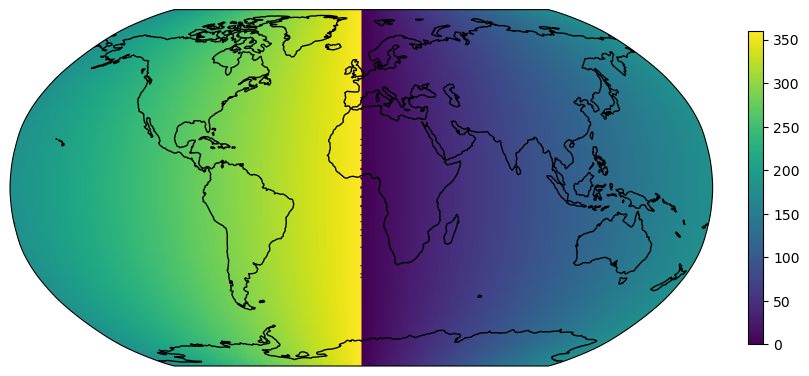

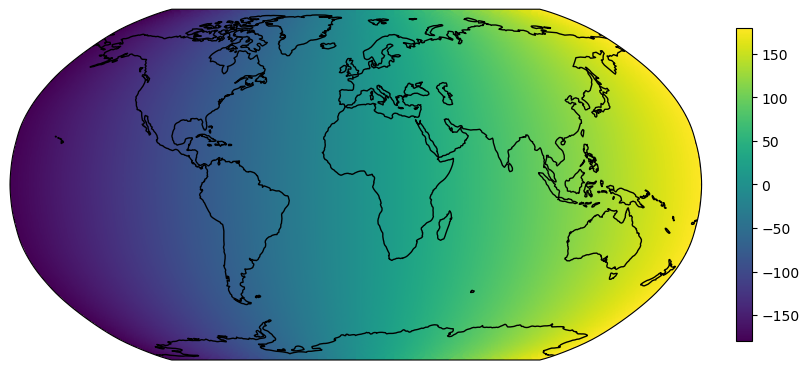

In [69]:
%%time

print(ds.lon.isel(cell=np.where(ds.lon>180)[0]))
worldmap(ds.lon)
ds = ds.assign_coords(lon=(((ds.lon + 180) % 360) - 180))
print(ds.lon.isel(cell=np.where(ds.lon>180)[0]))
worldmap(ds.lon)

In [63]:
ds.lon

<xarray.DataArray 'lon' (cell: 196608)> Size: 2MB
array([ 45.       ,  45.3515625,  44.6484375, ..., 315.3515625,
       314.6484375, 315.       ], shape=(196608,))
Coordinates:
    crs      int64 8B 0
  * cell     (cell) int64 2MB 0 1 2 3 4 5 ... 196603 196604 196605 196606 196607
    lat      (cell) float64 2MB 0.2984 0.5968 0.5968 ... -0.5968 -0.5968 -0.2984
    lon      (cell) float64 2MB 45.0 45.35 44.65 45.0 ... 315.4 314.6 315.0
Attributes:
    units:          degree_east
    standard_name:  longitude
    axis:           X

In [64]:
(((ds.lon + 180) % 360) - 180)

<xarray.DataArray 'lon' (cell: 196608)> Size: 2MB
array([ 45.       ,  45.3515625,  44.6484375, ..., -44.6484375,
       -45.3515625, -45.       ], shape=(196608,))
Coordinates:
    crs      int64 8B 0
  * cell     (cell) int64 2MB 0 1 2 3 4 5 ... 196603 196604 196605 196606 196607
    lat      (cell) float64 2MB 0.2984 0.5968 0.5968 ... -0.5968 -0.5968 -0.2984
    lon      (cell) float64 2MB 45.0 45.35 44.65 45.0 ... 315.4 314.6 315.0

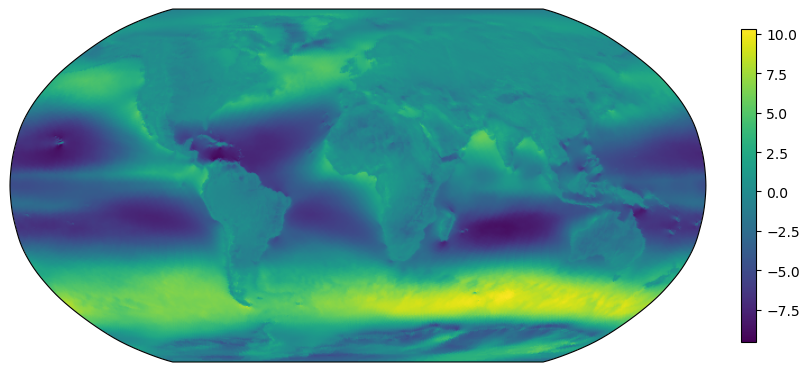

In [10]:
# SCREAM
worldmap(ds_scream.uas.sel(time=slice('2020-01-01', '2020-12-31')).mean(dim='time')) 

In [11]:
%%time

# native output at a higher zoom; this is just a one-month mean 
worldmap(dsn.uas.sel(time=slice('2020-01-01', '2020-01-31')).mean(dim='time'))

NameError: name 'dsn' is not defined

CPU times: user 3.99 s, sys: 3.37 s, total: 7.36 s
Wall time: 5.36 s


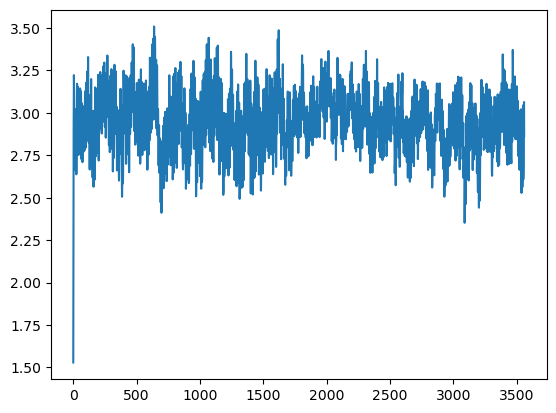

In [12]:
%%time

# area weighted global mean is easy in healpix, could use a lower zoom to go faster
plt.plot(ds.pr.mean("cell")*86400)

CPU times: user 550 ms, sys: 281 ms, total: 831 ms
Wall time: 469 ms


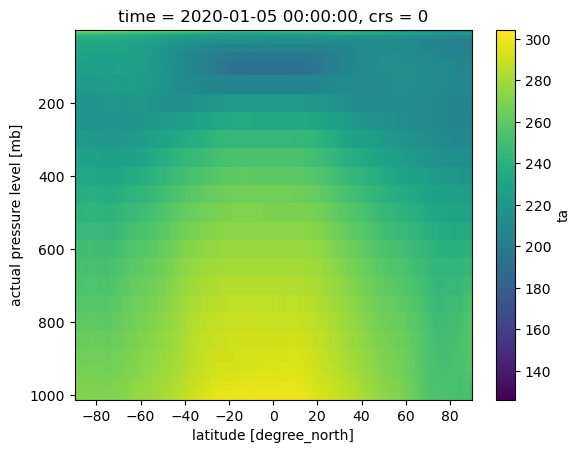

In [13]:
%%time

# snapshot
var='ta'
tm='2020-01-05'
tmp=ds[var].sel(time=tm)[0]

tmp

# zonal mean 
zm = (
    tmp
    .groupby("lat")
    .mean()
).compute()

zm.plot()
plt.gca().invert_yaxis()

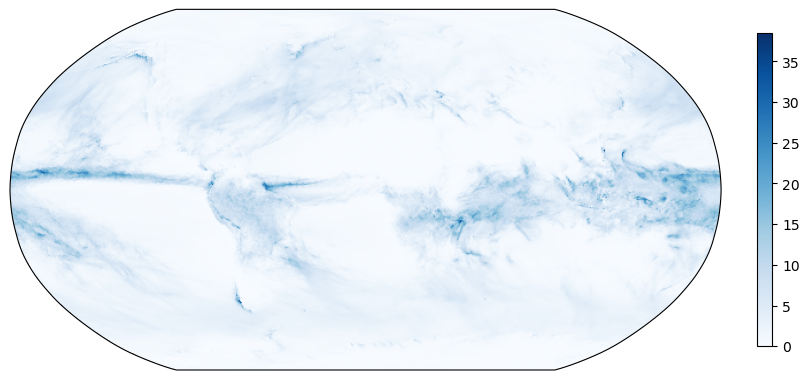

In [26]:
# trying out a different colormap
worldmap(ds.pr.sel(time=slice('2020-01-01', '2020-01-31')).mean(dim='time')*86400, cmap="Blues")

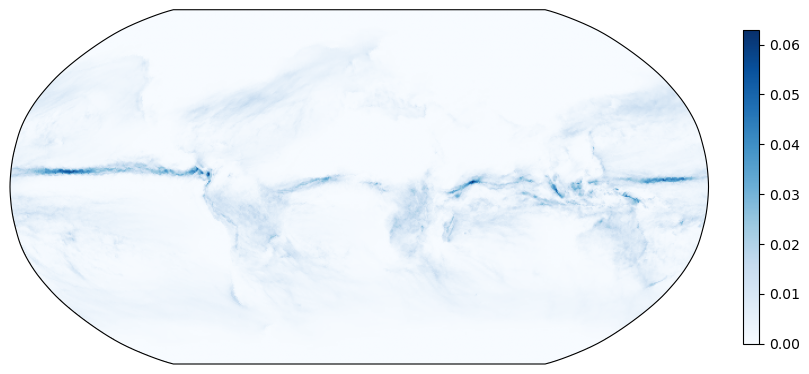

In [27]:
worldmap(ds_scream.pr.sel(time=slice('2020-01-01', '2020-01-31')).mean(dim='time')*86400, cmap="Blues")

In [ ]:
plt.plot(ds.pr.mean("cell")*86400)

In [49]:
import intake

cat = intake.open_catalog("https://data.nextgems-h2020.eu/catalog.yaml")

In [50]:
zoom = 7
ds = cat.ICON.ngc3028(zoom=zoom, time="PT30M").to_dask()

KeyError: '.zmetadata'

In [14]:
import cartopy.crs as ccrs
import easygems.healpix as egh
import healpix as hp
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

In [15]:
def get_axis_europe():
    """Create cartyop.GeoAxis with an extent centered around Europe."""
    _, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()})
    ax.coastlines()
    ax.set_extent([-40, 60, 20, 65])

    return ax


def plot_extent_box(ax, extent, edgecolor="m", linewidth=2):
    """Add a rectangular patch around an extent to a cartopy.GeoAxis."""
    return ax.add_patch(
        plt.Rectangle(
            xy=[extent[0], extent[2]],
            width=extent[1] - extent[0],
            height=extent[3] - extent[2],
            facecolor="none",
            edgecolor=edgecolor,
            linewidth=linewidth,
            transform=ccrs.PlateCarree(),
        )
    )

/home/ws1802/.conda/envs/easy25/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


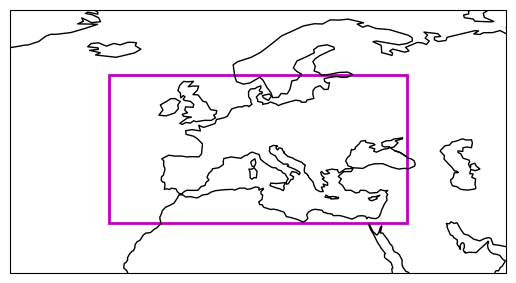

In [16]:
extent = [-20, 40, 30, 60]  # Europe

ax = get_axis_europe()
plot_extent_box(ax, extent);

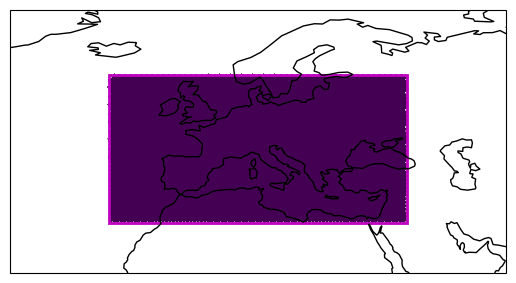

In [21]:
# Compute HEALPix lat/lon coordinates for a given order (zoom level)
order = zoom = 7
nside = hp.order2nside(order)
npix = hp.nside2npix(nside)

hp_lon, hp_lat = hp.pix2ang(nside, np.arange(npix), nest=True, lonlat=True)
hp_lon = (hp_lon + 180) % 360 - 180

# Find all grid points within the defined extent
icell, = np.where(
    (hp_lon > extent[0]) &
    (hp_lon < extent[1]) &
    (hp_lat > extent[2]) &
    (hp_lat < extent[3])
)

# Plot the selected points
ax = get_axis_europe()
plot_extent_box(ax, extent)

region = np.full_like(hp_lon, fill_value=np.nan)  # Full HEALPix with NaNs
region[icell] = 1  # Set selected values to 1
egh.healpix_show(region);

In [27]:
ds2 = ds.isel(cell = icell)

ds2

<xarray.Dataset> Size: 30GB
Dimensions:  (time: 3560, cell: 5924, plev: 31, pfull: 79)
Coordinates:
  * pfull    (pfull) float32 316B 4.514 8.301 12.45 16.74 ... 989.5 994.3 998.3
  * plev     (plev) float32 124B 1.0 2.0 3.0 5.0 7.0 ... 925.0 950.0 975.0 1e+03
  * time     (time) object 28kB 2019-10-20 03:00:00 ... 2021-01-07 00:00:00
    crs      int64 8B 0
  * cell     (cell) int64 47kB 3735 3739 3740 3741 ... 81916 81917 81918 81919
    lat      (cell) float64 47kB 30.35 30.35 30.35 30.69 ... 41.01 41.01 41.41
    lon      (cell) float64 47kB 38.67 37.27 37.97 38.32 ... 0.3516 359.6 0.0
Data variables: (12/38)
    clivi    (time, cell) float32 84MB ...
    clt      (time, cell) float32 84MB ...
    clwvi    (time, cell) float32 84MB ...
    hflsd    (time, cell) float32 84MB ...
    hfssd    (time, cell) float32 84MB ...
    hur      (time, plev, cell) float32 3GB ...
    ...       ...
    uas      (time, cell) float32 84MB ...
    va       (time, plev, cell) float32 3GB ...
    vas      (time, cell) float32 84MB ...
    wa       (time, plev, cell) float32 3GB ...
    wap      (time, plev, cell) float32 3GB ...
    zg       (time, plev, cell) float32 3GB ...

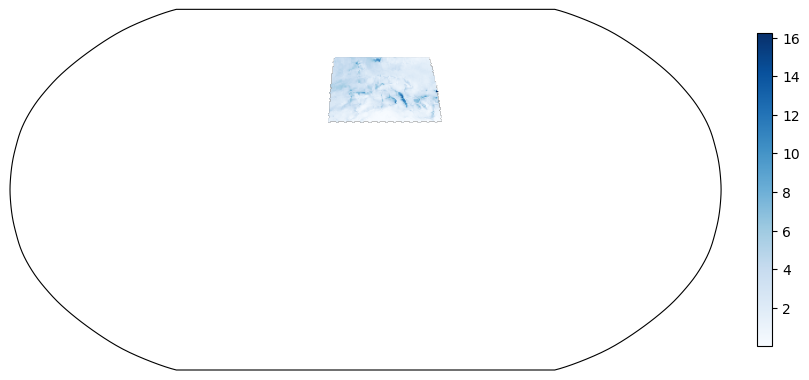

In [24]:
worldmap(ds2.pr.sel(time=slice('2020-01-01', '2020-01-31')).mean(dim='time')*86400, cmap="Blues")